In [1]:
%run "../Retropy_framework.py"

https://www.bdcinvestor.com/bdc-etfs

In [2]:
priv_equity_all = [PEX, PSP] # also: LSE:IPRV
priv_equity = [PSP]
biz_dev_all = [BIZD, BDCS, BDCL, BDCZ, BUY]
biz_dev = [BDCS, BDCL]
alts = [ALTY]

In [3]:
all = get(priv_equity + [SPY, cjb])
[x.name for x in get(all, despike=True, trim=True, reget=True)]

trimmed data from 1995-01-03 [SPY, VWEHX = cjb] to 2006-10-24 [PSP]


['PSP', 'SPY', 'VWEHX = cjb']

In [4]:
all = priv_equity + [SPY, cjb]
all = get(all, mode="PR", reget=True, start=2013)
show_risk_return_ntr_mode(all)
showRiskReturn(*all, ret_func=get_curr_net_yield)
show(all)

trimmed data from 1995-01-03 [SPY, VWEHX = cjb] to 2006-10-24 [PSP]


Exception: no name

In [166]:
%debug


> <ipython-input-115-252d406df03f>(75)wrap()
     73     name = name or s.name
     74     if not name:
---> 75         raise Exception("no name")
     76     if isinstance(s, pd.Series):
     77         s = Wrapper(s)

ipdb> u
> <ipython-input-115-f220516f9ef6>(80)despike()
     78     ret = logret(s, dropna=False).fillna(0)
     79     new_s[(ret - ret.mean()).abs() > ret.shift(shift).rolling(window).std().fillna(ret.max()) * std] = np.nan
---> 80     return wrap(new_s.interpolate(), s.name)
     81 
     82 def filterByStart(lst, start=None):

ipdb> u
> <ipython-input-115-252d406df03f>(304)get()
    302 
    303     if despike:
--> 304         s = globals()["despike"](s)
    305 
    306     if interpolate and s.shape[0] > 0 and mode != "divs" and mode != "raw":

ipdb> symbolName
*** NameError: name 'symbolName' is not defined
ipdb> u
> <ipython-input-115-252d406df03f>(224)getNtr()
    222     mode = getArgs["mode"]
    223     getArgs["mode"] = "PR"
--> 224     pr = get(s, **getArg

In [39]:
yld = lmap(getYield, all)
show(yld, range(0, 20, 1), ta=False, log=False)

In [15]:
# TICC, FSC
bdc_comps = [ 'ABDC','ACSF','AINV','ARCC','BKCC','CPTA','CODI','EQS','FDUS','FSC','GARS','GLAD','GAIN','GBDC','GECC','HCAP','HTGC','HRZN','KCAP','MAIN','MCC','MRCC','MVC','NMFC','OFS','OHAI','OXLC','PFLT','PNNT','PSEC','SLRC','SUNS','SCM','CGBD','TCPC','TCRD','TSLX','TCAP','TPVG','WHF']
bdc_comps = [ 'ABDC','ACSF','AINV','ARCC','BKCC','CPTA','CODI','EQS','FDUS','GARS','GLAD','GAIN','GBDC','GECC','HCAP','HTGC','HRZN','KCAP','MAIN','MCC','MRCC','MVC','NMFC','OFS','OHAI','OXLC','PFLT','PNNT','PSEC','SLRC','SUNS','SCM','CGBD','TCPC','TCRD','TSLX','TCAP','TPVG','WHF']
all = get(bdc_comps, source="Y")

In [21]:
show(getMedianSer(lmap(get_income, all)), ta=False, log=False)

In [14]:
#all = [x for x in all if x.shape[0]>0]
t = get("BDCS", mode="NTR")
all2 = get(all, trim=True, start=2005, mode="NTR")
pred = lrret(t, all2, return_pred=True)

dropped: PFLT@Y, SLRC@Y, BKCC@Y, PNNT@Y, OXLC@Y, TCRD@Y, TCAP@Y, GAIN@Y, TPVG@Y, WHF@Y, GBDC@Y, MCC@Y, HCAP@Y, FDUS@Y, SCM@Y, CODI@Y, MRCC@Y, ABDC@Y, HTGC@Y, CGBD@Y, OFS@Y, TSLX@Y, HRZN@Y, MAIN@Y, KCAP@Y, GARS@Y, FSC@Y, NMFC@Y, CPTA@Y, TCPC@Y, SUNS@Y, ACSF@Y, GECC@Y
trimmed data from 1992-09-11 [EQS@Y] to 2004-11-10 [OHAI@Y]


R^2: 0.9306998324213035


trimmed data from 1990-01-02 [VFINX] to 2004-11-10 [BDCS - fit]


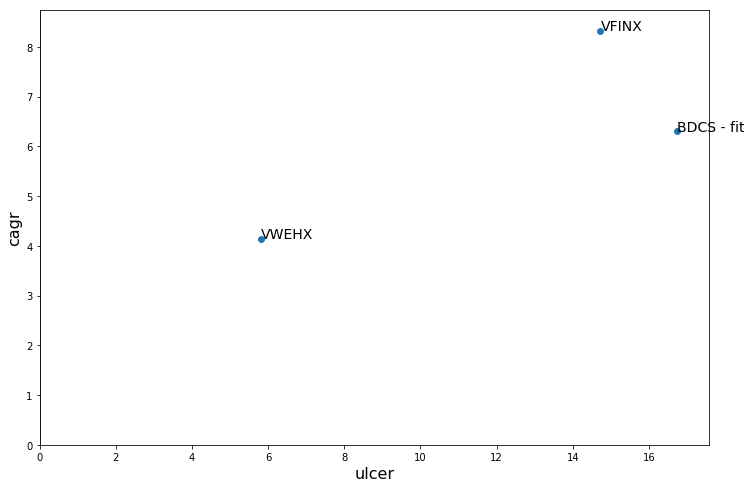

In [84]:
lst = get([pred, lc, cjb], mode="NTR")
show(lst, trim=False)
showRiskReturn(*lst)
show(lmap(dd, lst))
#show(BDCS)

In [162]:
def price(sym):
    return get(sym, mode="PR", reget=True)
    
def get_income(sym, value=100000, nis=True, per_month=True, smooth=6, net=True):
    start = None
    if is_series(sym):
        start = sym.index[0]
    price = get(sym, mode="PR", reget=True)
    if start:
        price = price[start:]
    units = value / price[0]
    div = divs(sym).s
    if start:
        div = div[start:]
    income = div * units
    if net:
        income *= 0.75
    if per_month:
        income = income.resample("M").sum()
        interval = get_divs_interval(div)
        income = ma(income, interval)
    #income = income.replace(0, np.nan).interpolate()
#     if per_month:
#         income /= 12
    if nis:
        income = convertSeries(income, "USD", "ILS")
    if smooth:
        income = ma(income, smooth)
    return name(income, price.name)

def adj_inf(s):
    cpi = get(cpiUS)
    s = get(s)
    return name(s / cpi, s.name)

from functools import lru_cache

@lru_cache(maxsize=12)
def get_inflation(smooth=None):
    cpi = get(cpiUS, interpolate=False)
    inf = (cpi / cpi.shift(12) - 1) * 100
    inf = inf.asfreq("D").interpolate()
    if smooth:
        inf = ma(inf, smooth)
    return name(inf, "inflation")

def get_real_yield(s):
    yld = getYield(s)
    inf = get_inflation(365*7)
    return name(yld - inf, yld.name + " real").dropna()

def roi(s,value=100000):
    income = get_income(s, value=value, nis=False, per_month=True)
    return income/value * 100 * 12

def cagr(s):
    days = (s.index[-1] - s.index[0]).days
    if days <= 0:
        return np.nan
    years = days/365
    val = s[-1] / s[0]
    return (math.pow(val, 1/years)-1)*100

def cum_cagr(s):
    s = get(s)
    days = (s.index - s.index[0]).days
    years = days/365
    val = s / s[0]
    return (np.power(val, 1/years)-1)*100
    

In [153]:
all = get(["PSP", "BDCS", "BDCL", "MORL", "SPY", cjb], trim=True, source="AV")

show(lmap(adj_inf, lmap(price, all)), 1, title="real price")

income = lmap(get_income, all)
show(income, income[0].mean(), 0, ta=False, log=False, title="net income")

show(lmap(roi, all), ta=False, log=False, title="net ROI")

yields = lmap(get_real_yield, all)
yields[0] = ma(yields[0], 8).dropna()
show(yields, 0, ta=False, log=False, title="real gross yield")

yields = lmap(getYield, all)
yields[0] = ma(yields[0], 8).dropna()
show(yields, get_inflation(365*7)[getCommonDate(yields, agg=min):], 0, ta=False, log=False, title="nominal gross yield")

trimmed data from 1995-01-03 [SPY@AV, VWEHX = cjb@AV] to 2012-10-17 [MORL@AV]
